# Airbnb & Zillow Data in NYC Profit Analysis

## 1. Introduction

The following code is the whole process for the profitability analysis. To run this report, please read the [README.md](README.md) first. 

### 1.1 Assumption Summary

Here are the assumptions this analysis report is using. 

1. The investor will pay for the property in cash.
2. The time value of money discount rate is 0%.
3. All properties and all square feet within each locale can be assumed to be homogeneous.
4. Two bedrooms are most profitable.

    * using `price`, `weekly_price`, `monthly_price` calculated average price per square feet is constant within each neighborhood.
    * using current home median value calculated average cost per square feet is constant within each neighborhood.


5. Only the following features can influence the profitability:

    * `neighbourhood_group_cleansed` 
    * `zipcode`
    * `latitude`
    * `longitude`
    * `bedrooms`
    * `price`
    * `weekly_price`
    * `monthly_price` 
    * `availability_30`
    * `availability_60`
    * `availability_90`
    * `availability_365`
    * `square_feet`


6. For each `neighbourhood_group_cleansed`" partition, price variables (`price`, `weekly_price`, `monthly_price`) within 10% ~ 90% quantile are qualified for estimation.
7. The airbnb customer ratio among single day, weekly and monthly is `{'day' : 3,'week' : 1,'month' : 1}`. 
8. If price variables (`price`, `weekly_price`, `monthly_price`) are missing or zero, it means the house doesn't support weekly or monthly rent.
9. The availability variables (`availability_365`, `availability_90`, `availability_60`, `availability_30`) that are not zero or missing and within 10% ~ 90% quantile are qualified.
10.  The availability days is uniformed distributed within 365 days. So we can use $ \frac{availability\_90}{90} * 365$, $\frac{availability\_60}{60}*365$, $\frac{availability\_30}{30}*365$ to calculate `availability_365`, when `availability_365` is not qualified.
11. `availability_365` calculation priority: $availability\_365 > availability\_90 > availability\_60 > availability\_30$ 
12. Occupancy rate is 75%.
13. The calculated past 5 years (2012-06 to 2017-06)'s month over month percentage change rates' average is the average growth rate from 2017-06 to now.
14. The estimated yearly revenue is the annual profit.
15. The annual profit is constant among the break even years.

Most of these assumptions can be tested directly from the pipeline. User can use the following module `product_pipeline` to test.

```python

import product_pipeline

airbnb_revenue = feature_revenue_pipeline.set_params(...).fit_transform(...)
zillow_cost = current_value_pipeline..set_params(...).fit_transform(...)
final = profit_pipeline.set_params(...).fit_transform(airbnb_revenue, zillow_cost)
```

### 1.2 Evaluation Matrix Selection

* Annual return on investment
* Break even years

## 2. Packages Loading and Settings

In [1]:
from data_init.airbnb_data import AirbnbData
from data_init.zillow_data import ZillowData
import pandas as pd
import numpy as np
import scipy
from sklearn.preprocessing import FunctionTransformer, StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from util import *
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.express as px
import re
import datetime
import matplotlib.pyplot as plt

In [2]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

## 3. Init Zillow and Airbnb Datasets

In [3]:
zillow = ZillowData()
zillow.loadZillowData()

airbnb = AirbnbData()
airbnb.fetchAirbnbData()
airbnb.loadAirbnbData()

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_columns', 500)

zillowInfo = zillow.data.describe().reset_index()
airbnbInfo = airbnb.data.describe().reset_index()

With the pre conclustion that 2 bedroom is the most profitable one. Let's limited Airbnb data to New York City 2 bedrooms first.

In [4]:
airbnb_filter = airbnb.data['bedrooms'] == 2.0
airbnb_data = airbnb.data[airbnb_filter].copy()

Limited Zillow Data to NYC

In [5]:
zillow_filter = zillow.data['City'] == 'New York'
zillow_data = zillow.data[zillow_filter].copy()

## 4. Airbnb Data Insight

In [6]:
### Data dimension
airbnb_data.shape

(6497, 106)

**Summary**:There are {{airbnb_data.shape[0]}} rows and {{airbnb_data.shape[1]}} columns for two bedrooms airbnb data

In [7]:
airbnb_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6497 entries, 19 to 48873
Data columns (total 106 columns):
id                                              int64
listing_url                                     object
scrape_id                                       int64
last_scraped                                    object
name                                            object
summary                                         object
space                                           object
description                                     object
experiences_offered                             object
neighborhood_overview                           object
notes                                           object
transit                                         object
access                                          object
interaction                                     object
house_rules                                     object
thumbnail_url                                   float64
medium_url 

**_Assumption_**: With the real estate industry knowledge, only following fields has been taken as the init feature selection. We will go back to check this later.
* neighbourhood_group_cleansed 
* zipcode
* latitude
* longitude
* bedrooms
* price
* weekly_price
* monthly_price 
* availability_30
* availability_60
* availability_90
* availability_365
* square_feet

In [8]:
selected_feature = [
    "neighbourhood_group_cleansed", "zipcode", "latitude", "longitude",
    "price", "weekly_price", "monthly_price", "availability_30",
    "availability_60", "availability_90", "availability_365", "square_feet"
]

selected_feature_ix = [
    airbnb_data.columns.get_loc(c) for c in selected_feature
]

Using sklearn FunctionTransformer to extract features, so that we can build a reusable pipeline.

In [9]:
def extract_feature(X):
    return X.iloc[:, selected_feature_ix]

In [10]:
feature_selector = FunctionTransformer(extract_feature, validate=False)

In [11]:
airbnb_data_selected_df = feature_selector.fit_transform(airbnb_data)

### 4.1 Airbnb Data Cleaning

Let's take a look at the basic information about the dataset

In [12]:
basicInfoAnalysis(airbnb_data_selected_df)

# of numeric columns: 7
# of object columns: 5
# of category columns: 0
# of bool columns: 0
********** Numeric Variable Insight **********
          latitude    longitude  availability_30  availability_60  \
count  6497.000000  6497.000000      6497.000000      6497.000000   
mean     40.724140   -73.956733         6.422503        16.311067   
std       0.052073     0.044105         9.053389        19.096649   
min      40.508730   -74.239140         0.000000         0.000000   
25%      40.686400   -73.985350         0.000000         0.000000   
50%      40.719610   -73.959580         2.000000         8.000000   
75%      40.759670   -73.941350        10.000000        28.000000   
max      40.905270   -73.716900        30.000000        60.000000   

       availability_90  availability_365  square_feet  
count      6497.000000       6497.000000   101.000000  
mean         27.042789        123.605048   844.762376  
std          29.811322        129.414869   468.567821  
min           

**Summary**: With no data type reference when we are importing the data, there are several data type we might want to fix.

* Price related variables need to remove "$" and cast to numeric 
* zipcode with "-" or zipcode has only 4 digits need to be fixed

Also, there are missing values among these variables.
Let's also take a look at the missing values

In [13]:
airbnb_missing = missingAnalysis(airbnb_data_selected_df)

**Summary**: only less than 1% of the zipcode is missing. 

### 4.2 Airbnb Insight Pipeline Build

In [14]:
neighbourhood_group_cleansed_ix, zipcode_ix, latitude_ix, \
longitude_ix, price_ix, weekly_price_ix, monthly_price_ix, \
availability_30_ix, availability_60_ix, availability_90_ix, \
availability_365_ix, square_feet_ix = [
    list(airbnb_data.columns).index(col) for col in selected_feature
]


class FeatureCleaning(BaseEstimator, TransformerMixin):
    def __init__(self, price_ix, weekly_price_ix, monthly_price_ix,
                 zipcode_ix):
        self.price_ix = price_ix
        self.weekly_price_ix = weekly_price_ix
        self.monthly_price_ix = monthly_price_ix
        self.zipcode_ix = zipcode_ix

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        for ix in [self.price_ix, self.weekly_price_ix, self.monthly_price_ix]:
            X.iloc[:, ix] = X.iloc[:, ix].str.replace("$", "").str.replace(
                ",", "").astype(float)

        X.iloc[:, zipcode_ix] = X.iloc[:, zipcode_ix].str[:5]
        return X

Now, we can come up a pipeline for the basic preprocessing.

In [15]:
feature_pipeline = Pipeline([('feature_clean',
                              FeatureCleaning(price_ix, weekly_price_ix,
                                              monthly_price_ix, zipcode_ix))])

In [16]:
airbnb_prepared_df = feature_pipeline.fit_transform(airbnb.data.copy())

In [17]:
categorical_count_plot(airbnb_prepared_df, "zipcode")

Let's plot it on the map to see for missing values to see are there any missing pattern.

In [18]:
tdf = airbnb_prepared_df[airbnb_prepared_df["zipcode"].isnull()]
nyc_map_plot(tdf, size="price")

**Summary**:It seems the missing values randomly distributed on the map. So it should be safe to drop the missing record.

Let's re-define our feature cleaning class for the pipeline

In [19]:
class FeatureCleaning(BaseEstimator, TransformerMixin):
    def __init__(self, price_ix, weekly_price_ix, monthly_price_ix,
                 zipcode_ix):
        self.price_ix = price_ix
        self.weekly_price_ix = weekly_price_ix
        self.monthly_price_ix = monthly_price_ix
        self.zipcode_ix = zipcode_ix

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        for ix in [self.price_ix, self.weekly_price_ix, self.monthly_price_ix]:
            X.iloc[:, ix] = X.iloc[:, ix].str.replace("$", "").str.replace(
                ",", "").astype(float)

        X.iloc[:, zipcode_ix] = X.iloc[:, zipcode_ix].str[:5]
        X = X.loc[
            ~X.iloc[:, zipcode_ix].isnull(), :]  #drop missing zipcode record
        return X

In [20]:
feature_pipeline = Pipeline([
    ('feature_clean',
     FeatureCleaning(price_ix, weekly_price_ix, monthly_price_ix, zipcode_ix)),
])

In [21]:
airbnb_prepared_df = feature_pipeline.fit_transform(airbnb.data.copy())

### 4.3 Airbnb Square Feet Imputation

#### 4.3.1 Square Feet Variable Insight

Let's take a look at the square_feet variable distribution first.

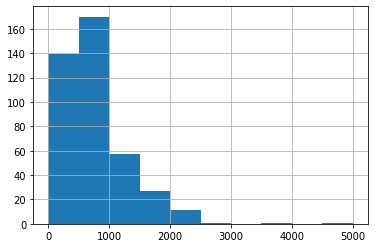

In [22]:
airbnb_prepared_df.square_feet.hist()
plt.show()

In [23]:
fig = go.Figure()
fig.add_trace(go.Box(x=airbnb_prepared_df.square_feet))
fig.show()

**Summary**: We see there is also `square_feet == 0` records. We can also try to fill it. 

#### 4.3.2 Price Related Variables Insight

**_Assumption_**: with the strong assumption that "All properties and all square feet within each locale can be assumed to be
homogeneous". We can impute the "`square_feet`" variable with `neighbourhood_group_cleansed` and price variables (`price`, `weekly_price`, `monthly_price`)

We need take a look at the price distribution to find the qualified records

In [24]:
# Add histogram data
x1 = airbnb_prepared_df['price'].dropna()
x2 = airbnb_prepared_df['weekly_price'].dropna()
x3 = airbnb_prepared_df['monthly_price'].dropna()

# Group data together
hist_data = [x1, x2, x3]

group_labels = ['price', 'weekly price', 'monthly price']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=200)
fig.show()

Let's also limited to 2 bedrooms

In [25]:
def limit_bedrooms(X, n=2):
    return X[X['bedrooms'] == n]

In [26]:
feature_pipeline = Pipeline([('feature_clean',
                              FeatureCleaning(price_ix, weekly_price_ix,
                                              monthly_price_ix, zipcode_ix)),
                             ('limit_bedrooms',
                              FunctionTransformer(limit_bedrooms,
                                                  validate=False,
                                                  kw_args={'n': 2}))])

In [27]:
airbnb_prepared_final = feature_pipeline.fit_transform(airbnb.data.copy())

Let' take a look at the distribution of the price related data first.

In [28]:
# Add histogram data
hist_data = []
group_labels = []
for v in airbnb_prepared_final['neighbourhood_group_cleansed'].unique():
    x = airbnb_prepared_final.loc[
        airbnb_prepared_final['neighbourhood_group_cleansed'] ==
        v, 'price'].dropna()
    hist_data += [x]
    group_labels += [v]

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=20)
fig.show()

**Summary**: We see there are a lot extremly large values and 0s

Let's calculate new daily price with "`price`", "`weekly_price`" and "`monthly_price`" without outliers.  

### 4. 4 Build Airbnb Qualified Price Variable

**_Assumption_**: Using 10% lower bond and 90% upper bond to remove the price variables outliers within "`neighbourhood_group_cleansed`" partition.

In [29]:
def get_val_prices_ix(
        X,
        price_ix,
        neighbourhood_group_cleansed_ix=neighbourhood_group_cleansed_ix,
        lb=.1,
        ub=.9):
    no_zero = X.iloc[:, price_ix] != 0
    val_ix = no_zero
    for v in X.iloc[:, neighbourhood_group_cleansed_ix].unique():
        ngc_ix = X.iloc[:, neighbourhood_group_cleansed_ix] == v
        val_ix[ngc_ix] = (no_zero[ngc_ix]) & (
            X.loc[no_zero & ngc_ix, X.columns[price_ix]].between(
                X.loc[no_zero & ngc_ix, X.columns[price_ix]].quantile(lb),
                X.loc[no_zero & ngc_ix, X.columns[price_ix]].quantile(ub)))

    return val_ix


X = airbnb_prepared_final
val_price_ix = get_val_prices_ix(X, price_ix)
val_weekly_price_ix = get_val_prices_ix(X, weekly_price_ix)
val_monthly_price_ix = get_val_prices_ix(X, monthly_price_ix)

In [30]:
# Add histogram data
hist_data = []
group_labels = []
for v in X.loc[val_price_ix, 'neighbourhood_group_cleansed'].unique():
    x = X.loc[(X['neighbourhood_group_cleansed'] == v) &
              (val_price_ix), 'price'].dropna()
    hist_data += [x]
    group_labels += [v]

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=20)
fig.update_layout(title='qualified daily price distribution')
fig.show()

In [31]:
# Add histogram data
hist_data = []
group_labels = []
for v in X.loc[val_weekly_price_ix, 'neighbourhood_group_cleansed'].unique():
    x = X.loc[(X['neighbourhood_group_cleansed'] == v) &
              (val_weekly_price_ix), 'weekly_price'].dropna()
    hist_data += [x]
    group_labels += [v]

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=100)
fig.update_layout(title='qualified weekly price distribution')
fig.show()

In [32]:
# Add histogram data
hist_data = []
group_labels = []
for v in X.loc[val_monthly_price_ix, 'neighbourhood_group_cleansed'].unique():
    if v != "Staten Island":
        x = X.loc[(X['neighbourhood_group_cleansed'] == v) &
                  (val_monthly_price_ix), 'monthly_price'].dropna()
        hist_data += [x]
        group_labels += [v]

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=200)
fig.update_layout(title='qualified monthly price distribution')
fig.show()

**Summary**: With removing outliers and zeros, the price related variables distribution looks much better now.

### 4.5 Build Square Feet Imputation Pipeline with Qualified Price Variables & Neighborhood Group Variable

In [33]:
class FeatureCleaning(BaseEstimator, TransformerMixin):
    def __init__(self, price_ix, weekly_price_ix, monthly_price_ix,
                 zipcode_ix):
        self.price_ix = price_ix
        self.weekly_price_ix = weekly_price_ix
        self.monthly_price_ix = monthly_price_ix
        self.zipcode_ix = zipcode_ix

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        for ix in [self.price_ix, self.weekly_price_ix, self.monthly_price_ix]:
            X.iloc[:, ix] = X.iloc[:, ix].str.replace("$", "").str.replace(
                ",", "").astype(float)

        X.iloc[:, zipcode_ix] = X.iloc[:, zipcode_ix].str[:5]
        X = X.loc[~X.iloc[:, zipcode_ix].isnull(), :]
        return X


class SquareFeetImputation(BaseEstimator, TransformerMixin):
    def __init__(self, lb, ub):
        self.lb = lb
        self.ub = ub

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # Get qualified price index
        val_price_ix = get_val_prices_ix(X, price_ix,
                                         neighbourhood_group_cleansed_ix,
                                         self.lb, self.ub)
        val_weekly_price_ix = get_val_prices_ix(
            X, weekly_price_ix, neighbourhood_group_cleansed_ix, self.lb,
            self.ub)
        val_monthly_price_ix = get_val_prices_ix(
            X, monthly_price_ix, neighbourhood_group_cleansed_ix, self.lb,
            self.ub)
        # build price varibles and their qualified index as a key value pair dictionary
        val_col_row_pair = {
            price_ix: val_price_ix,
            weekly_price_ix: val_weekly_price_ix,
            monthly_price_ix: val_monthly_price_ix
        }
        # for each price variable (price, weekly price, monthly price)
        for col_ix in val_col_row_pair.keys():
            # each iteration will fill some square feet with priority: price>weekly>monthly
            val_row = val_col_row_pair[col_ix]
            # among validated price, weekly price, monthly_price rows, get no missing square_feet data
            sqrf_no_missing = X[(~X.iloc[:, square_feet_ix].isnull())
                                & (val_row) & (X.iloc[:, square_feet_ix] != 0)]
            # aggregate by neighbourhood, sum qualified records square feet and price
            agg_df = sqrf_no_missing.groupby(
                sqrf_no_missing.columns[neighbourhood_group_cleansed_ix]).agg({
                    sqrf_no_missing.columns[square_feet_ix]:
                    'sum',
                    sqrf_no_missing.columns[col_ix]:
                    'sum'
                }).reset_index()
            # calculate price per square feet
            agg_df['price_per_sqrf'] = agg_df[
                sqrf_no_missing.columns[col_ix]] / agg_df['square_feet']
            # update square feet missing index
            sqrf_missing_ix = (X.iloc[:, square_feet_ix].isnull()) | (
                X.iloc[:, square_feet_ix] == 0)  # missing or zero records
            # group by each neighbourhood
            for neighborhood in agg_df.neighbourhood_group_cleansed:
                X.loc[(X.neighbourhood_group_cleansed == neighborhood)
                      & (sqrf_missing_ix) &
                      (val_row), X.columns[square_feet_ix]] = X.loc[
                          (X.neighbourhood_group_cleansed == neighborhood)
                          & (sqrf_missing_ix)
                          & (val_row), X.columns[col_ix]] / agg_df.loc[
                              agg_df.neighbourhood_group_cleansed ==
                              neighborhood, 'price_per_sqrf'].values

        return X

In [34]:
feature_pipeline = Pipeline([
    ('feature_clean',
     FeatureCleaning(price_ix, weekly_price_ix, monthly_price_ix, zipcode_ix)),
    ('limit_bedrooms',
     FunctionTransformer(limit_bedrooms, validate=False, kw_args={'n': 2})),
    ('sqrf_impute', SquareFeetImputation(lb=.1, ub=.9)),
    ('feature_selector', FunctionTransformer(extract_feature, validate=False))
])

In [35]:
airbnb_prepared_final = feature_pipeline.fit_transform(airbnb.data.copy())

Let's check how many records have none of the 3 price variables are qualified, which will cause "square_feet" variable missing.

In [36]:
sqrf_missing = airbnb_prepared_final.square_feet.isnull().sum()
sqrf_missing

1264

There are still some square_feet missing.
Let's take a look at their distribution.

In [37]:
nyc_map_plot(airbnb_prepared_final[airbnb_prepared_final.square_feet.isnull()],
             size="price",
             color="zipcode")

**Summary**: Missing records seems randomly distributed on map. So it shouldn't be related to zipcode

It's safe to drop these records, and rewrite our SquareFeetImputation Class

Instead of saving 3 boolean price qualification columns to distinguish their complicated qualified situations, following code used one binary column to store.
```python
X['collapses_price_val'] = val_price_ix.values.astype(
            int) + (val_weekly_price_ix.values.astype(
                int) << 1) + (val_monthly_price_ix.values.astype(int) << 2)
```
Situation Table:

|monthly_qualified|weekly_qualified|daily_qualified|binary_value|stored_value|
|---|---|---|---|---|
|False|False|False|000|0|
|False|False|True|001|1|
|False|True|False|010|2|
|False|True|True|011|3|
|True|False|False|100|4|
|True|False|True|101|5|
|True|True|False|110|6|
|True|True|True|111|7|

In [38]:
class SquareFeetImputation(BaseEstimator, TransformerMixin):
    def __init__(self, lb, ub):
        self.lb = lb
        self.ub = ub

    def fit(self, X, y=None):
        return self

    def transform(self, X):

        # Find index of the outliers regarding the price variables
        val_price_ix = get_val_prices_ix(X, price_ix,
                                         neighbourhood_group_cleansed_ix,
                                         self.lb, self.ub)
        val_weekly_price_ix = get_val_prices_ix(
            X, weekly_price_ix, neighbourhood_group_cleansed_ix, self.lb,
            self.ub)
        val_monthly_price_ix = get_val_prices_ix(
            X, monthly_price_ix, neighbourhood_group_cleansed_ix, self.lb,
            self.ub)
        # mark price variables are outlier or not.
        # use integer to store multiple boolean columns
        X['collapses_price_val'] = val_price_ix.values.astype(int) + (
            val_weekly_price_ix.values.astype(int) << 1) + (
                val_monthly_price_ix.values.astype(int) << 2)

        val_col_row_pair = {
            price_ix: val_price_ix,
            weekly_price_ix: val_weekly_price_ix,
            monthly_price_ix: val_monthly_price_ix
        }

        for col_ix in val_col_row_pair.keys():
            val_row = val_col_row_pair[col_ix]
            # among validated price, weekly price, monthly_price rows, get no missing square_feet data
            sqrf_no_missing = X[(~X.iloc[:, square_feet_ix].isnull())
                                & (val_row) & (X.iloc[:, square_feet_ix] != 0)]
            """
            group by neighbourhood_group_cleansed, sum square feet and one of the price variables 
            where this selected price is qualified
            """
            agg_df = sqrf_no_missing.groupby(
                sqrf_no_missing.columns[neighbourhood_group_cleansed_ix]).agg({
                    sqrf_no_missing.columns[square_feet_ix]:
                    'sum',
                    sqrf_no_missing.columns[col_ix]:
                    'sum'
                }).reset_index()

            agg_df['price_per_sqrf'] = agg_df[
                sqrf_no_missing.columns[col_ix]] / agg_df['square_feet']

            sqrf_missing_ix = (X.iloc[:, square_feet_ix].isnull()) | (
                X.iloc[:, square_feet_ix] == 0)
            """for each neighborhood using average price_per_sqrt is constant assumption
            calculating square feet with price > weekly_price > monthly_price"""

            for neighborhood in agg_df.neighbourhood_group_cleansed:
                X.loc[(X.neighbourhood_group_cleansed == neighborhood)
                      & (sqrf_missing_ix) &
                      (val_row), X.columns[square_feet_ix]] = X.loc[
                          (X.neighbourhood_group_cleansed == neighborhood)
                          & (sqrf_missing_ix)
                          & (val_row), X.columns[col_ix]] / agg_df.loc[
                              agg_df.neighbourhood_group_cleansed ==
                              neighborhood, 'price_per_sqrf'].values

        return X[~X.iloc[:, square_feet_ix].isnull(
        )]  # drop square feet missing according to previous plots

In [39]:
feature_pipeline = Pipeline([
    ('feature_clean',
     FeatureCleaning(price_ix, weekly_price_ix, monthly_price_ix, zipcode_ix)),
    ('limit_bedrooms',
     FunctionTransformer(limit_bedrooms, validate=False, kw_args={'n': 2})),
    ('sqrf_impute', SquareFeetImputation(lb=.1, ub=.9)),
])

In [40]:
airbnb_prepared_final = feature_pipeline.fit_transform(airbnb.data.copy())

## 5. Airbnb Revenue Calculation

### 5.1 Airbnb Revenue Related Variables Insight

**_Assumption_**: The airbnb customer ratio among _single day, weekly and monthly_ is `{'day' : 3,'week' : 1,'month' : 1}`. 

**_Assumption_**: If weekly price or monthly price are missing or zero, it means the house doesn't support weekly or monthly rent.

In [41]:
customer_ratio = {'day': 3, 'week': 1, 'month': 1}

In [42]:
X = airbnb_prepared_final
val_price_ix = X.iloc[:, price_ix] != 0
val_weekly_price_ix = (X.iloc[:, weekly_price_ix] !=
                       0) & (~X.iloc[:, weekly_price_ix].isnull())
val_monthly_price_ix = (X.iloc[:, monthly_price_ix] !=
                        0) & (~X.iloc[:, monthly_price_ix].isnull())

**_Assumption_**: The qualified availability variables should be not zero or missing and within 10% ~ 90% quantile 

In [43]:
def get_val_avail_ix(X, avail_ix, lb=0.1, ub=0.9):
    no_missing_or_zero_ix = (X.iloc[:, avail_ix] !=
                             0) & (~X.iloc[:, avail_ix].isnull())
    return no_missing_or_zero_ix & (X.iloc[:, avail_ix].between(
        X.loc[no_missing_or_zero_ix, X.columns[avail_ix]].quantile(lb),
        X.loc[no_missing_or_zero_ix, X.columns[avail_ix]].quantile(ub)))


val_avail_30 = get_val_avail_ix(X, availability_30_ix)
val_avail_60 = get_val_avail_ix(X, availability_60_ix)
val_avail_90 = get_val_avail_ix(X, availability_90_ix)
val_avail_365 = get_val_avail_ix(X, availability_365_ix)

In [44]:
val_avail_365.sum(), val_avail_90.sum(), val_avail_60.sum(), val_avail_30.sum()

(2909, 2786, 2702, 2281)

**Summary**: With all 4 variables related to availability, availability_365 has the largest number of qualified records. 

**_Assumption_**: The availability days is uniformed distributed within 365 days. So we can use $ \frac{availability\_90}{90} * 365$, $\frac{availability\_60}{60}*365$, $\frac{availability\_30}{30}*365$ to calculate `availability_365`, when `availability_365` is not qualified.

**_Assumption_**: `availability_365` calculation priority: $availability\_365 > availability\_90 > availability\_60 > availability\_30$ 

Before we start calculating "`availability_365`", here are their distribution.

In [45]:
# Add histogram data
hist_data = []
group_labels = []
val_avail = [val_avail_365, val_avail_90, val_avail_60, val_avail_30]
avail_ix = [availability_365_ix, availability_365_ix, availability_365_ix]

In [46]:
hist_data = [
    X.loc[val_avail_365, X.columns[availability_365_ix]],
    X.loc[val_avail_90, X.columns[availability_90_ix]],
    X.loc[val_avail_60, X.columns[availability_60_ix]],
    X.loc[val_avail_30, X.columns[availability_30_ix]]
]
group_labels = [
    X.columns[availability_365_ix], X.columns[availability_90_ix],
    X.columns[availability_60_ix], X.columns[availability_30_ix]
]
# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=[10, 10, 7, 1])
fig.update_layout(title='qualified availabilities distribution')
fig.show()

In [47]:
fig = go.Figure()
for i in range(4):
    fig.add_trace(go.Box(x=hist_data[i], name=group_labels[i]))
fig.show()

Now from the plots, we can see it should be appropriate, if we use `availability_365` to calculate the yearly revenue.

Let's take a look at the availability variables (90 days, 60 days, 30 days), when `availability_365` is not qualified.

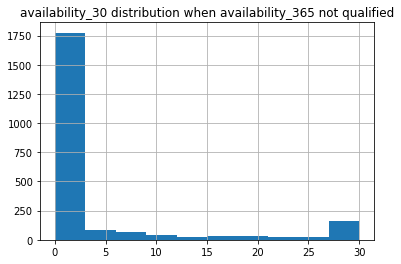

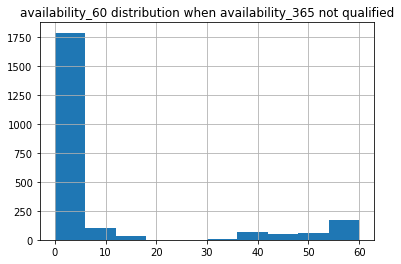

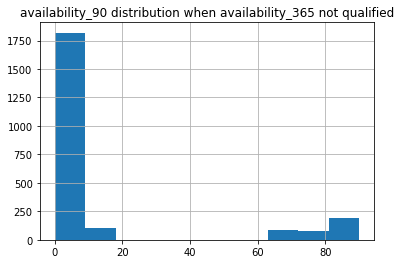

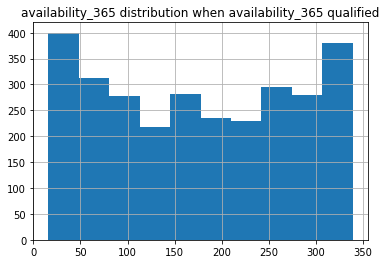

In [48]:
t = X[~val_avail_365]  # availability_365 not qualified dataset
t.availability_30.hist()
plt.title("availability_30 distribution when availability_365 not qualified")
plt.show()
t.availability_60.hist()
plt.title("availability_60 distribution when availability_365 not qualified")
plt.show()
t.availability_90.hist()
plt.title("availability_90 distribution when availability_365 not qualified")
plt.show()
X[val_avail_365].availability_365.hist()
plt.title("availability_365 distribution when availability_365 qualified")
plt.show()

In [49]:
nyc_map_plot(t, color='zipcode')

**Summary**: No specific pattern for unqualified `availability_365`. So we should be able to calculate the `availability_365` when it's not qualified.

### 5.2 Build Pipeline to Calculate Availability 365

In [50]:
class CalAvail365(BaseEstimator, TransformerMixin):
    def __init__(self, lb, ub):
        self.lb = lb
        self.ub = ub

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # get qualified availability index
        val_avail_30 = get_val_avail_ix(X, availability_30_ix, self.lb,
                                        self.ub)
        val_avail_60 = get_val_avail_ix(X, availability_60_ix, self.lb,
                                        self.ub)
        val_avail_90 = get_val_avail_ix(X, availability_90_ix, self.lb,
                                        self.ub)
        val_avail_365 = get_val_avail_ix(X, availability_365_ix, self.lb,
                                         self.ub)
        # availability_365 not qualified, but availability_90 qualified
        X.loc[(~val_avail_365) &
              (val_avail_90), X.columns[availability_365_ix]] = X.loc[
                  (~val_avail_365) &
                  (val_avail_90), X.columns[availability_90_ix]] / 90 * 365
        # availability_365 and availability_90 not qualified, but availability_60 qualified
        X.loc[(~val_avail_365) & (~val_avail_90) &
              (val_avail_60), X.columns[availability_365_ix]] = X.loc[
                  (~val_avail_365) & (~val_avail_90) &
                  (val_avail_60), X.columns[availability_60_ix]] / 60 * 365
        # availability_365, availability_90 and availability_60 not qualified, but availability_30 qualified
        X.loc[(~val_avail_365) & (~val_avail_90) & (~val_avail_60) &
              (val_avail_30), X.columns[availability_365_ix]] = X.loc[
                  (~val_avail_365) & (~val_avail_90) & (~val_avail_60) &
                  (val_avail_30), X.columns[availability_30_ix]] / 30 * 365
        return X[get_val_avail_ix(X, availability_365_ix, self.lb, self.ub)]

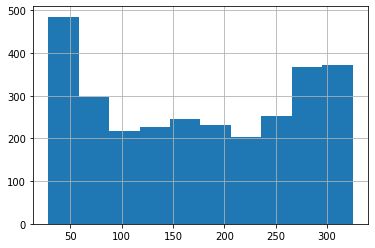

(2899, 107)

In [51]:
ca365 = CalAvail365(0.1, 0.9)
X_tmp = ca365.fit_transform(X)
X_tmp.availability_365.hist()
plt.show()
X_tmp.shape

After calculated using other availability, the distribution of the `availability_365` is even better 

Now we can build a separate pipeline for generating estimated revenue

With the customer_ratio assumption(`{'day' : 3,'week' : 1,'month' : 1}`), we can calculating the estimated annual revenue using the formula showing below.


$$
customer\_weight\_matrix=\left(\begin{array}{cc} 
0 & 0 & 0\\
0 & 0 & 1\\
0 & 1 & 0\\
0 & \frac{1}{4} & \frac{3}{4}\\
1 & 0 & 0\\
\frac{1}{4} & 1 & \frac{3}{4}\\
\frac{1}{2} & \frac{1}{2} & 0\\
\frac{1}{5} & \frac{1}{5} & \frac{3}{5}\\
\end{array}\right)
$$

**_For i From 0 to 7:_**

{

$est\_yearly\_revenue[collapses\_price\_val==i] = (monthly\_price[collapses\_price\_val==i] \times customer\_weights\_matrix[i,2] 
+ weekly\_price[collapses\_price\_val==i] \times customer\_weights\_matrix[i,1] 
+ daily\_price[collapses\_price\_val==i] \times customer\_weights\_matrix[i,0]) \times availability\_365[collapses\_price\_val==i] \times occupancy\_rate $

}

In [52]:
def yearly_revenue_generate(X, customer_ratio, occupancy_rate):
    # build customer weights matrix
    customer_weights_matrix = np.array(
        [[0, 0, 0], [0, 0, 1], [0, 1, 0],
         [
             0, customer_ratio['week'] /
             (customer_ratio['week'] + customer_ratio['day']),
             customer_ratio['day'] /
             (customer_ratio['week'] + customer_ratio['day'])
         ], [1, 0, 0],
         [
             customer_ratio['month'] /
             (customer_ratio['month'] + customer_ratio['day']), 0,
             customer_ratio['day'] /
             (customer_ratio['month'] + customer_ratio['day'])
         ],
         [
             customer_ratio['month'] /
             (customer_ratio['month'] + customer_ratio['week']),
             customer_ratio['week'] /
             (customer_ratio['month'] + customer_ratio['week']), 0
         ],
         [
             customer_ratio['month'] /
             (customer_ratio['month'] + customer_ratio['week'] +
              customer_ratio['day']), customer_ratio['week'] /
             (customer_ratio['month'] + customer_ratio['week'] +
              customer_ratio['day']), customer_ratio['day'] /
             (customer_ratio['month'] + customer_ratio['week'] +
              customer_ratio['day'])
         ]])
    # using np.dot calculate dot product between price matrix and weights matrix
    # then multiple availability and occupancy
    for i in X['collapses_price_val'].drop_duplicates():
        rix = X['collapses_price_val'] == i
        cix = [monthly_price_ix, weekly_price_ix, price_ix]
        X.loc[rix, 'est_yearly_revenue'] = np.dot(
            np.nan_to_num(X.loc[rix, X.columns[cix]].values),
            customer_weights_matrix[i, :]
        ) * X.loc[rix, X.columns[availability_365_ix]].values * occupancy_rate

    return X[X['collapses_price_val'] != 0]

In [53]:
revenue_pipeline = Pipeline([('avail_cal', CalAvail365(0.1, 0.9)),
                             ('gen_revenue',
                              FunctionTransformer(yearly_revenue_generate,
                                                  validate=False,
                                                  kw_args={
                                                      'customer_ratio': {
                                                          'day': 3,
                                                          'week': 1,
                                                          'month': 1
                                                      },
                                                      'occupancy_rate': 0.75
                                                  }))])

In [54]:
airbnb_revenue = revenue_pipeline.fit_transform(airbnb_prepared_final.copy())

## 6. Zillow Data Insight

In [55]:
time_col = [x for x in zillow_data.columns if re.search('\d{4}-\d{2}', x)]

In [56]:
zillow_data = zillow_data[["RegionName"] + time_col]
zillow_data.index = zillow_data.RegionName

Let's take a look at the missing information.

In [57]:
zillow_data_cleaned = zillow_data.drop("RegionName", axis=1)

In [58]:
zillow_df = zillow_data_cleaned.T

In [59]:
zillow_df_missing = missingAnalysis(zillow_df)

In [60]:
zillow_cleaned_missing = missingAnalysis(zillow_data_cleaned)

Let's also take a look at the time series data

In [61]:
fig = go.Figure()

for c in zillow_df.columns:
    fig.add_trace(go.Scatter(x=zillow_df.index, y=zillow_df[c], name=c))

fig.update_layout(title_text='Zillow Median Home Value',
                  xaxis_rangeslider_visible=True)
fig.show()

**Summary**: There is a relatively steady growth in the past 5 years (2012-06 to 2017-06).

**_Assumption_**: Using the past 5 years (2012-06 to 2017-06)'s month over month percentage change rates' average to predict current median home value.

In [62]:
zillow_pct_change = zillow_df.pct_change()[zillow_df.index > "2012-06"]

The months gap between "2012-06" and now: 

In [63]:
last_date = zillow_pct_change.index[-1]

In [64]:
month_gap = (pd.Timestamp(datetime.datetime.now()).to_period('M') -
             pd.Timestamp(last_date).to_period("M"))

The price percentage change has happened since "2012-06".

**_Assumption_**: The average month over month growth rate from "2012-06" to now equals to the past 5 years month over month growth rate average.

In [65]:
zillow_pct_now = ((zillow_pct_change.mean() + 1)**int(
    month_gap.freqstr[:-1])).reset_index()
zillow_pct_now.columns = ['RegionName', 'est_pct']

In [66]:
zillow_value_now = zillow_data_cleaned.merge(zillow_pct_now,
                                             on='RegionName',
                                             how='left')

In [67]:
zillow_value_now['current_value'] = zillow_value_now[
    last_date] * zillow_value_now['est_pct']

### 6.1 Build Pipeline to Calculate Current Median Home Value

Now we can build a pipeline for calculating the current median value.

In [68]:
def current_median(X, window_start):
    time_col = [x for x in X.columns if re.search('\d{4}-\d{2}', x)]
    X = X[["RegionName"] + time_col]
    X.index = X.RegionName
    zillow_data_cleaned = X.drop("RegionName", axis=1)
    zillow_df = zillow_data_cleaned.T
    zillow_pct_change = zillow_df.pct_change()[zillow_df.index > window_start]
    last_date = zillow_pct_change.index[-1]
    month_gap = (pd.Timestamp(datetime.datetime.now()).to_period('M') -
                 pd.Timestamp(last_date).to_period("M"))
    zillow_pct_now = ((zillow_pct_change.mean() + 1)**int(
        month_gap.freqstr[:-1])).reset_index()
    zillow_pct_now.columns = ['RegionName', 'est_pct']
    zillow_value_now = zillow_data_cleaned.merge(zillow_pct_now,
                                                 on='RegionName',
                                                 how='left')
    zillow_value_now['current_value'] = zillow_value_now[
        last_date] * zillow_value_now['est_pct']
    zillow_value_now = zillow_value_now[["RegionName", "current_value"]]
    zillow_value_now.columns = ["zipcode", 'current_value']
    return zillow_value_now

In [69]:
current_value_pipeline = Pipeline([
    ("current_value",
     FunctionTransformer(current_median,
                         validate=False,
                         kw_args={'window_start': "2012-06"}))
])

In [70]:
cm = FunctionTransformer(current_median,
                         validate=False,
                         kw_args={'window_start': "2012-06"})

In [71]:
zillow_cost = cm.fit_transform(zillow_data.copy())

## 7. Profit Calculation

Now we have the median home value within each of these zipcode in the Zillow data. But obviously, there are still some of zipcode doesn't have median price.

Since we are holding the strong assumption that "All properties and all square feet within each locale can be assumed to be homogeneous". We can use the median home value within each neighbourhood and the median square feet variable to get other zipcode's median home value within the same neighbourhood whose median home value cannot directly get from zillow data.

Then we can use the value of square feet is constant in each one of the `neighbourhood_group` and `square_feet` to calculate the estimated cost for each house.

### 7.1 Profit Related Variable Insight

**_Assumption_**: Here we assume the estimated yearly revenue is the annual profit.

In [72]:
X = airbnb_revenue
Y = zillow_cost
X.zipcode = X.zipcode.astype("int")
revenue_cost = X.merge(Y, how="left", on="zipcode")

In [73]:
current_val_filled = (~revenue_cost.current_value.isnull()).sum()
current_val_filled

668

**Summary**: Only these records' current median values have been directly filled. Let's check if all the neighbourhood is available for us, so we can calculate the rest of the zipcodes' median home value 

In [74]:
revenue_cost.loc[~revenue_cost.current_value.isnull(
), "neighbourhood_group_cleansed"].drop_duplicates()

7       Brooklyn
11     Manhattan
793       Queens
Name: neighbourhood_group_cleansed, dtype: object

Let's calculated other zipcode's est_current_value.

In [75]:
agg = revenue_cost[~revenue_cost.current_value.isnull()].groupby(
    revenue_cost.columns[neighbourhood_group_cleansed_ix]).agg({
        'current_value':
        'sum',
        revenue_cost.columns[square_feet_ix]:
        'sum'
    }).reset_index()

In [76]:
agg['avg_cost_per_square_feet'] = agg.iloc[:, 1] / agg.iloc[:, 2]
agg = agg[[
    revenue_cost.columns[neighbourhood_group_cleansed_ix],
    'avg_cost_per_square_feet'
]]

In [77]:
revenue_cost = revenue_cost.merge(
    agg, on=revenue_cost.columns[neighbourhood_group_cleansed_ix])

In [78]:
revenue_cost['est_cost'] = revenue_cost[
    'avg_cost_per_square_feet'] * revenue_cost.iloc[:, square_feet_ix]

**_Evaluation Matrix Selected_**:
    * Break Even Year
    * Annual Return on Investment (Annual ROI)


#### 7.1.1 Break Even Year

**_Assumption_**: The annual profit is constant among the break even years

In [79]:
revenue_cost['break_even_year'] = revenue_cost['est_cost'] / revenue_cost[
    'est_yearly_revenue']

In [80]:
final_break_even = revenue_cost.groupby('zipcode')[[
    'break_even_year'
]].median().reset_index().sort_values(by="break_even_year")

In [81]:
final_break_even

,zipcode,break_even_year
42,10282,10.723134
93,11367,14.550919
103,11379,14.654854
99,11374,16.030373
106,11412,16.406496
116,11426,20.204995
102,11378,20.313659
101,11377,21.656617
48,11105,21.710894
46,11103,21.799666


In [82]:
nyc_map_plot(revenue_cost, color="break_even_year")

Let's scale it and plot again.

In [83]:
scaler = MinMaxScaler(copy=False)
revenue_cost['scaled_break_even'] = scaler.fit_transform(
    revenue_cost['break_even_year'].values.reshape(-1, 1))

In [84]:
nyc_map_plot(revenue_cost, color="scaled_break_even")

#### 7.1.2 ROI

In [85]:
revenue_cost['annual_roi'] = revenue_cost['est_yearly_revenue'] / revenue_cost[
    'est_cost'] * 100
final_roi = revenue_cost.groupby('zipcode')[[
    'annual_roi'
]].median().reset_index().sort_values(by="annual_roi", ascending=False)
final_roi

,zipcode,annual_roi
42,10282,9.325632
93,11367,6.872418
103,11379,6.823678
99,11374,6.255038
106,11412,6.119648
116,11426,5.361461
96,11370,5.004030
95,11369,4.959352
102,11378,4.922796
94,11368,4.659462


In [86]:
nyc_map_plot(revenue_cost, color="annual_roi")

Let's scale it and plot again

In [87]:
revenue_cost['scaled_annual_roi'] = scaler.fit_transform(
    revenue_cost['annual_roi'].values.reshape(-1, 1))

In [88]:
nyc_map_plot(revenue_cost, color="scaled_break_even")

### 7.2 Build Profit Calculation Pipeline

In [89]:
class CalProfit(BaseEstimator, TransformerMixin):
    def __init__(self, X, Y):
        self.X = X
        self.Y = Y

    def fit(self, X, Y, y=None):
        return self

    def transform(self, X):
        self.X.zipcode = self.X.zipcode.astype("int")
        # left join airbnb data and zillow data
        revenue_cost = self.X.merge(self.Y, how="left", on="zipcode")
        # group by neighbourhood, sum revenue and square feet
        agg = revenue_cost[~revenue_cost.current_value.isnull()].groupby(
            revenue_cost.columns[neighbourhood_group_cleansed_ix]).agg({
                'current_value':
                'sum',
                revenue_cost.columns[square_feet_ix]:
                'sum'
            }).reset_index()
        # calculate average cost per square feet
        agg['avg_cost_per_square_feet'] = agg.iloc[:, 1] / agg.iloc[:, 2]
        agg = agg[[
            revenue_cost.columns[neighbourhood_group_cleansed_ix],
            'avg_cost_per_square_feet'
        ]]
        # using the assumption that average cost per square feet is constant in each neighbourhood
        # to calculate estimated cost for each house
        revenue_cost = revenue_cost.merge(
            agg, on=revenue_cost.columns[neighbourhood_group_cleansed_ix])
        revenue_cost['est_cost'] = revenue_cost[
            'avg_cost_per_square_feet'] * revenue_cost.iloc[:, square_feet_ix]
        return revenue_cost

In [90]:
class CalEvaluationMatrix(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X['break_even_year'] = X['est_cost'] / X[
            'est_yearly_revenue']  #break even years calculation
        X['annual_roi'] = X['est_yearly_revenue'] / X[
            'est_cost'] * 100  #annual ROI calculation
        return X


def top_n_zipcode(X, variable: "['break_even_year', 'annual_roi']",
                  top_n) -> DataFrame:
    """
    calcualate the median of the selected variable, then get the top n records
    """
    final_roi = X.groupby('zipcode')[[
        variable
    ]].median().reset_index().sort_values(by=variable)
    return final_roi.head(top_n)[["zipcode", variable]]

In [91]:
profit_pipeline = Pipeline([('cal_profit',
                             CalProfit(airbnb_revenue, zillow_cost)),
                            ('cal_roi_year', CalEvaluationMatrix()),
                            ('top_n_zipcode',
                             FunctionTransformer(top_n_zipcode,
                                                 validate=False,
                                                 kw_args={
                                                     'variable': 'annual_roi',
                                                     'top_n': 10
                                                 }))])

**Result**: Top 10 zip code by annual ROI

In [92]:
profit_pipeline.fit_transform(airbnb_revenue, zillow_cost)

,zipcode,annual_roi
41,10280,0.419163
3,10004,0.558884
36,10044,0.599979
67,11219,0.623730
77,11230,0.709173
68,11220,0.939867
58,11210,0.956956
28,10033,0.994486
65,11217,1.021038
91,11361,1.023552


**Result**: Top 20 zip code by number of break even years

In [93]:
profit_pipeline.set_params(top_n_zipcode__kw_args={
    'variable': 'break_even_year',
    'top_n': 20
}).fit_transform(airbnb_revenue, zillow_cost)

,zipcode,break_even_year
42,10282,10.723134
93,11367,14.550919
103,11379,14.654854
99,11374,16.030373
106,11412,16.406496
116,11426,20.204995
102,11378,20.313659
101,11377,21.656617
48,11105,21.710894
46,11103,21.799666


## What's next

* If we have the specfic number of the daily price taker, weekly_price taker and monthly price taker instead of using the customer ratio assumption, we should be able to get a better revenue calculation.


* We have some zip code missing instance, but we have longitude and latitude. With the help of [Google API](https://developers.google.com/places/web-service/intro), we should be able to get the zip code directly.


* Zillow median house value has only very limited zip codes. If we can get more median house values in other zip codes. We can calculate average value per square feet on zip code level not the neighborhood level.


* We create a UI web page to let the customer to decide the business targets like which city is the best location to invest, how many numbers of the bedrooms is most profitable, what is the real customer ratio, or what evaluation matrix our client want to see. With `product_pipeline` module, just re-fit and transform the data with the `set_params()`. We can reproduce all the logic and get the results in seconds


* The most updated median value of the house is about 2 years ago. And we can try to use time series model find the Trend and Seasonality. `GridSerachCV` the best period for the time series, then predict the current median value of the home instead of just using the past 5 years windows growth rate average.


* The sample of the airbnb data is quite unbalanced regarding the zip code. We can try oversampling the minority zip codes or undersampling the majority zip code to get a better result. 


* Bronx and Staten Island have very limited records, and with my assumptions, all of them is not qualified for the later analysis steps. This create the risk of my analysis result, because none of them will be defined profitable which might not be the truth. If we can get more records or test weaker outlier assumptions, we might get a more convincible result. If not, we can try bootstrap resampling to generate more records, while still holding the original distribution.